In [1]:
import pandas as pd
from datetime import datetime
import ta
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
def calculate_rsi(data, periods=14):
    delta = data.diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=periods).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=periods).mean()
    rs = gain / loss
    return 100 - (100 / (1 + rs))

# Custom MACD calculation
def calculate_macd(data, fast=12, slow=26, signal=9):
    exp1 = data.ewm(span=fast, adjust=False).mean()
    exp2 = data.ewm(span=slow, adjust=False).mean()
    macd = exp1 - exp2
    signal = macd.ewm(span=signal, adjust=False).mean()
    histogram = macd - signal
    return pd.DataFrame({'MACD': macd, 'Signal': signal, 'Histogram': histogram})

# Load NIFTY50 data
data = pd.read_csv(r'C:\Users\pc\Desktop\Python\NIFTY50.csv')

# Preprocess data
data['datetime'] = pd.to_datetime(data['datetime'])
data.set_index('datetime', inplace=True)
df = data[['open', 'high', 'low', 'close']].copy()
df.columns = ['open', 'high', 'low', 'close']

# Calculate RSI
df['RSI_10'] = calculate_rsi(df['close'], periods=10)

# Calculate MACD
macd_df = calculate_macd(df['close'], fast=8, slow=21, signal=5)
df = df.join(macd_df)

# Initialize signals and positions
buy_signals = []
sell_signals = []
profits = []

# Tracking variables
buy_confirmation = False
buy_signal = False
sell_signal = False

# Strategy Logic
for i in range(len(df)):
    # Buy Logic
    if df['RSI_10'].iloc[i] < 30 and not buy_confirmation:
        buy_signal = True
        entry_time = df.index[i]
        entry_price = df['close'].iloc[i]

    # Buy Confirmation
    if buy_signal and not buy_confirmation:
        if df['MACD'].iloc[i] > df['Signal'].iloc[i]:
            buy_confirmation = True
            buy_signals.append((entry_time, 'Long', entry_price))
            buy_signal = False

    # Sell Logic
    if df['RSI_10'].iloc[i] >= 70 and buy_confirmation:
        sell_signal = True
        exit_time = df.index[i]
        exit_price = df['close'].iloc[i]

    # Sell Confirmation
    if sell_signal and buy_confirmation:
        if df['MACD'].iloc[i] < df['Signal'].iloc[i]:
            profit = exit_price - entry_price
            profits.append((entry_time, 'Long', exit_time, profit))
            buy_confirmation = False
            sell_signal = False

# Convert results to DataFrame
final_data = pd.DataFrame(profits, columns=['Entry_Date_Time', 'Position', 'Exit_Date_Time', 'Profit'])

# Display results
print(final_data)

          Entry_Date_Time Position      Exit_Date_Time  Profit
0     2017-07-17 09:44:00     Long 2017-07-17 10:00:00   17.05
1     2017-07-17 10:03:00     Long 2017-07-17 10:16:00    8.80
2     2017-07-17 10:47:00     Long 2017-07-17 10:57:00    3.95
3     2017-07-17 11:05:00     Long 2017-07-17 11:59:00   -0.50
4     2017-07-17 12:20:00     Long 2017-07-17 12:32:00    5.35
...                   ...      ...                 ...     ...
10020 2022-12-20 11:51:00     Long 2022-12-20 12:15:00   36.90
10021 2022-12-20 12:57:00     Long 2022-12-20 13:07:00   18.20
10022 2022-12-20 13:19:00     Long 2022-12-20 13:25:00   10.55
10023 2022-12-20 13:35:00     Long 2022-12-20 13:49:00   26.20
10024 2022-12-20 13:56:00     Long 2022-12-20 14:13:00   39.80

[10025 rows x 4 columns]


<Axes: >

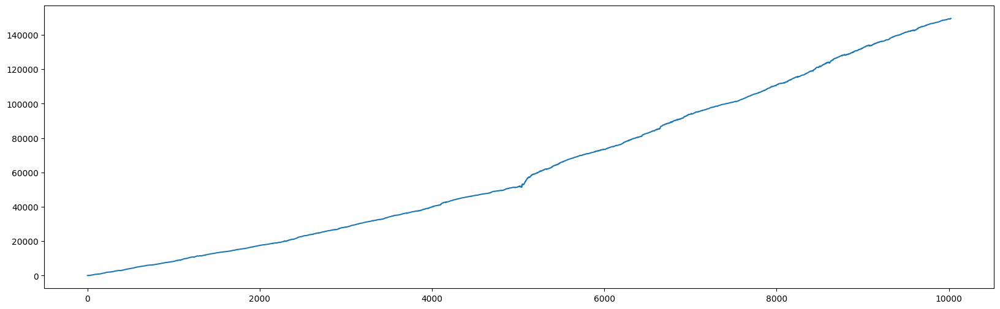

In [3]:
intraday_trade_log=pd.DataFrame(final_data)
import matplotlib.pyplot as plt
plt.figure(figsize=(20,6))
intraday_trade_log['Profit'].cumsum().plot()


<Axes: >

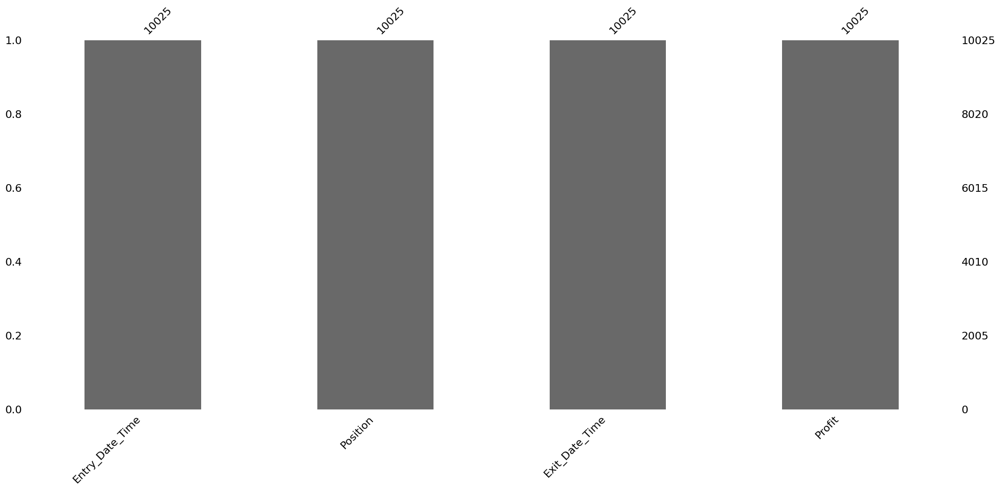

In [4]:
import missingno as msno
msno.bar(intraday_trade_log)


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10025 entries, 0 to 10024
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   Entry_Date_Time  10025 non-null  datetime64[ns]
 1   Position         10025 non-null  object        
 2   Exit_Date_Time   10025 non-null  datetime64[ns]
 3   Profit           10025 non-null  float64       
dtypes: datetime64[ns](2), float64(1), object(1)
memory usage: 313.4+ KB


<Axes: >

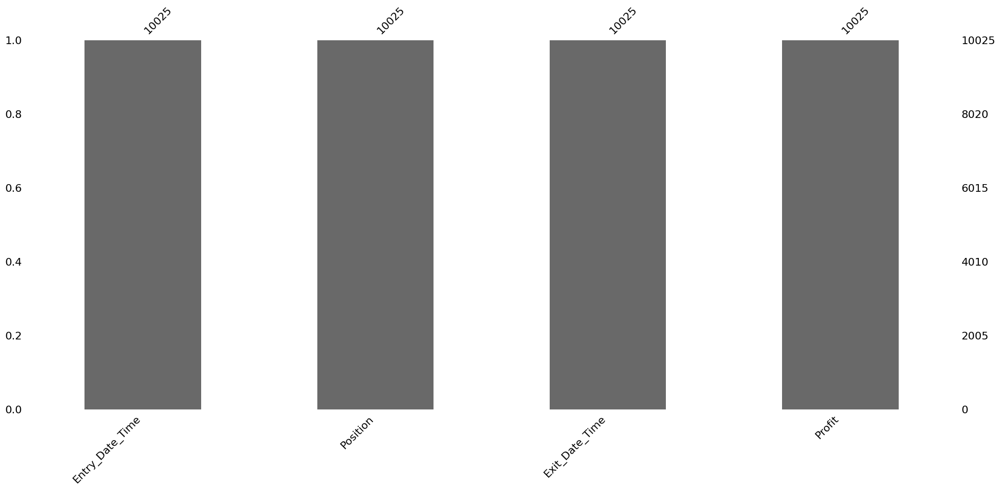

In [5]:
intraday_trade_log=intraday_trade_log[intraday_trade_log['Entry_Date_Time'].notna()]
intraday_trade_log=intraday_trade_log[intraday_trade_log['Position'].notna()]
intraday_trade_log=intraday_trade_log[intraday_trade_log['Exit_Date_Time'].notna()]
intraday_trade_log=intraday_trade_log[intraday_trade_log['Profit'].notna()]
intraday_trade_log.info()
msno.bar(intraday_trade_log)

In [6]:
insample_trade_log = intraday_trade_log[:int(len(intraday_trade_log)/2)]
outsample_trade_log = intraday_trade_log[int(len(intraday_trade_log)/2):]
insample_trade_log
outsample_trade_log


,Entry_Date_Time,Position,Exit_Date_Time,Profit
5012,2020-03-05 09:30:00,Long,2020-03-05 10:29:00,18.95
5013,2020-03-05 11:19:00,Long,2020-03-05 11:33:00,33.80
5014,2020-03-05 11:55:00,Long,2020-03-05 12:10:00,12.05
5015,2020-03-05 12:43:00,Long,2020-03-05 12:53:00,19.80
5016,2020-03-05 13:00:00,Long,2020-03-05 14:24:00,-22.65
...,...,...,...,...
10020,2022-12-20 11:51:00,Long,2022-12-20 12:15:00,36.90
10021,2022-12-20 12:57:00,Long,2022-12-20 13:07:00,18.20
10022,2022-12-20 13:19:00,Long,2022-12-20 13:25:00,10.55
10023,2022-12-20 13:35:00,Long,2022-12-20 13:49:00,26.20


In [7]:
initial_capital=200000
intraday_trade_log['Quantity']=50

In [8]:
intraday_trade_log['PnL_Including_Slippages'] = (intraday_trade_log['Profit'])*intraday_trade_log['Quantity']
intraday_trade_log

,Entry_Date_Time,Position,Exit_Date_Time,Profit,Quantity,PnL_Including_Slippages
0,2017-07-17 09:44:00,Long,2017-07-17 10:00:00,17.05,50,852.5
1,2017-07-17 10:03:00,Long,2017-07-17 10:16:00,8.80,50,440.0
2,2017-07-17 10:47:00,Long,2017-07-17 10:57:00,3.95,50,197.5
3,2017-07-17 11:05:00,Long,2017-07-17 11:59:00,-0.50,50,-25.0
4,2017-07-17 12:20:00,Long,2017-07-17 12:32:00,5.35,50,267.5
...,...,...,...,...,...,...
10020,2022-12-20 11:51:00,Long,2022-12-20 12:15:00,36.90,50,1845.0
10021,2022-12-20 12:57:00,Long,2022-12-20 13:07:00,18.20,50,910.0
10022,2022-12-20 13:19:00,Long,2022-12-20 13:25:00,10.55,50,527.5
10023,2022-12-20 13:35:00,Long,2022-12-20 13:49:00,26.20,50,1310.0


In [9]:
intraday_trade_log['PnL_Including_Slippages_Cumulative_Sum'] = intraday_trade_log['PnL_Including_Slippages'].cumsum()
intraday_trade_log

,Entry_Date_Time,Position,Exit_Date_Time,Profit,Quantity,PnL_Including_Slippages,PnL_Including_Slippages_Cumulative_Sum
0,2017-07-17 09:44:00,Long,2017-07-17 10:00:00,17.05,50,852.5,852.5
1,2017-07-17 10:03:00,Long,2017-07-17 10:16:00,8.80,50,440.0,1292.5
2,2017-07-17 10:47:00,Long,2017-07-17 10:57:00,3.95,50,197.5,1490.0
3,2017-07-17 11:05:00,Long,2017-07-17 11:59:00,-0.50,50,-25.0,1465.0
4,2017-07-17 12:20:00,Long,2017-07-17 12:32:00,5.35,50,267.5,1732.5
...,...,...,...,...,...,...,...
10020,2022-12-20 11:51:00,Long,2022-12-20 12:15:00,36.90,50,1845.0,7471727.5
10021,2022-12-20 12:57:00,Long,2022-12-20 13:07:00,18.20,50,910.0,7472637.5
10022,2022-12-20 13:19:00,Long,2022-12-20 13:25:00,10.55,50,527.5,7473165.0
10023,2022-12-20 13:35:00,Long,2022-12-20 13:49:00,26.20,50,1310.0,7474475.0


In [10]:
intraday_trade_log['Equity'] = 0
intraday_trade_log['Rate_of_Return'] = 0

In [11]:
for i in range(len(list(intraday_trade_log.index))):

    if i == 0:
        intraday_trade_log['Equity'].iloc[i] = initial_capital + intraday_trade_log['PnL_Including_Slippages'].iloc[i]
        intraday_trade_log['Rate_of_Return'].iloc[i] = (intraday_trade_log['PnL_Including_Slippages'].iloc[i]/initial_capital)*100
    else:
        intraday_trade_log['Equity'].iloc[i] = intraday_trade_log['Equity'].iloc[i-1] + intraday_trade_log['PnL_Including_Slippages'].iloc[i]
        intraday_trade_log['Rate_of_Return'].iloc[i] = (intraday_trade_log['PnL_Including_Slippages'].iloc[i]/intraday_trade_log['Equity'].iloc[i-1])*100

C:\Users\pc\AppData\Local\Temp\ipykernel_8488\138033945.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  intraday_trade_log['Equity'].iloc[i] = initial_capital + intraday_trade_log['PnL_Including_Slippages'].iloc[i]
C:\Users\pc\AppData\Lo

In [12]:
win_rate = round(len(intraday_trade_log[intraday_trade_log['PnL_Including_Slippages']>0])/len(intraday_trade_log),2)
print(f'Win Rate:{win_rate}')

Win Rate:0.85


In [13]:
mean_win = intraday_trade_log[intraday_trade_log['PnL_Including_Slippages']>0]['PnL_Including_Slippages'].mean()
mean_loss = intraday_trade_log[intraday_trade_log['PnL_Including_Slippages']<0]['PnL_Including_Slippages'].mean()
risk_reward = abs(mean_win/mean_loss)
expectancy = round((win_rate*risk_reward) - ((1-win_rate)*1),2)

print(f'Expectancy:{expectancy}')

Expectancy:0.55


In [14]:
import numpy as np
number_of_trading_days_in_a_year = 252
risk_free_interest_rate = 5
mean = intraday_trade_log['Rate_of_Return'].mean() * number_of_trading_days_in_a_year - risk_free_interest_rate
sigma = intraday_trade_log['Rate_of_Return'].std() * np.sqrt(number_of_trading_days_in_a_year)
sharpe_ratio = round(mean/sigma,2)

print(f'Sharpe Ratio:{sharpe_ratio}')

Sharpe Ratio:2.71


In [15]:
downside_standard_deviation = intraday_trade_log[intraday_trade_log['Rate_of_Return']<0]['Rate_of_Return'].std() * np.sqrt(number_of_trading_days_in_a_year)
sortino_ratio = round(mean/downside_standard_deviation,2)
print(f'Sortino Ratio:{sortino_ratio}')

Sortino Ratio:2.17


In [16]:
intraday_trade_log['Drawdown'] = intraday_trade_log['PnL_Including_Slippages_Cumulative_Sum'] - intraday_trade_log['PnL_Including_Slippages_Cumulative_Sum'].cummax()
max_drawdown = round(intraday_trade_log['Drawdown'].min(),2)
print(f'Max Drawdown [Rs.] :{max_drawdown}')

max_drawdown_percent = round(max_drawdown/intraday_trade_log[intraday_trade_log['Drawdown'] == intraday_trade_log['Drawdown'].min()]['Equity'].iloc[0]*100,2)
print(f'Max Drawdown Percent:{max_drawdown_percent}')

Max Drawdown [Rs.] :-33867.5
Max Drawdown Percent:-1.22


In [17]:
intraday_trade_log['Recovery'] = 0
for i in range(len(intraday_trade_log)):
    if (intraday_trade_log['Drawdown'].iloc[i] < 0):
        intraday_trade_log['Recovery'].iloc[i] = intraday_trade_log['Recovery'].iloc[i-1] + 1
recovery_trades = intraday_trade_log['Recovery'].max()
print(f'Number of trades done from Drawdown to achieve a new peak: {recovery_trades}')



C:\Users\pc\AppData\Local\Temp\ipykernel_8488\1759126011.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  intraday_trade_log['Recovery'].iloc[i] = intraday_trade_log['Recovery'].iloc[i-1] + 1
C:\Users\pc\AppData\Local\Temp\ipykernel_8488\

Number of trades done from Drawdown to achieve a new peak: 38


C:\Users\pc\AppData\Local\Temp\ipykernel_8488\1759126011.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intraday_trade_log['Recovery'].iloc[i] = intraday_trade_log['Recovery'].iloc[i-1] + 1
C:\Users\pc\AppData\Local\Temp\ipykernel_8488\1759126011.py:4: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = val

In [18]:
recovery_trades = intraday_trade_log['Recovery'].max()
print(f'Number of trades done from Drawdown to achieve a new peak: {recovery_trades}')

Number of trades done from Drawdown to achieve a new peak: 38


In [19]:
print(intraday_trade_log.columns)


Index(['Entry_Date_Time', 'Position', 'Exit_Date_Time', 'Profit', 'Quantity',
       'PnL_Including_Slippages', 'PnL_Including_Slippages_Cumulative_Sum',
       'Equity', 'Rate_of_Return', 'Drawdown', 'Recovery'],
      dtype='object')


In [20]:
intraday_trade_log.head()

,Entry_Date_Time,Position,Exit_Date_Time,Profit,Quantity,PnL_Including_Slippages,PnL_Including_Slippages_Cumulative_Sum,Equity,Rate_of_Return,Drawdown,Recovery
0,2017-07-17 09:44:00,Long,2017-07-17 10:00:00,17.05,50,852.5,852.5,200852.5,0.426250,0.0,0
1,2017-07-17 10:03:00,Long,2017-07-17 10:16:00,8.80,50,440.0,1292.5,201292.5,0.219066,0.0,0
2,2017-07-17 10:47:00,Long,2017-07-17 10:57:00,3.95,50,197.5,1490.0,201490.0,0.098116,0.0,0
3,2017-07-17 11:05:00,Long,2017-07-17 11:59:00,-0.50,50,-25.0,1465.0,201465.0,-0.012408,-25.0,1
4,2017-07-17 12:20:00,Long,2017-07-17 12:32:00,5.35,50,267.5,1732.5,201732.5,0.132777,0.0,0


In [21]:
intraday_trade_log_equity_high = intraday_trade_log[intraday_trade_log['Recovery'] == 0]

intraday_trade_log_equity_high['Entry_Date_Time'] = pd.to_datetime(intraday_trade_log_equity_high['Entry_Date_Time'])

intraday_trade_log_equity_high['number_days_between_equity_highs'] = intraday_trade_log_equity_high['Entry_Date_Time'] - intraday_trade_log_equity_high['Entry_Date_Time'].shift()

recovery_days = intraday_trade_log_equity_high['number_days_between_equity_highs'].apply(lambda x: x.days).max()

print(f'Number of Days taken from Drawdown to achieve a new peak: {recovery_days}')

Number of Days taken from Drawdown to achieve a new peak: 10.0


C:\Users\pc\AppData\Local\Temp\ipykernel_8488\1347973414.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intraday_trade_log_equity_high['Entry_Date_Time'] = pd.to_datetime(intraday_trade_log_equity_high['Entry_Date_Time'])
C:\Users\pc\AppData\Local\Temp\ipykernel_8488\1347973414.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  intraday_trade_log_equity_high['number_days_between_equity_highs'] = intraday_trade_log_equity_high['Entry_Date_Time'] - intraday_trade_log_equity_high['Entry_Date_Time'].shift

In [22]:

intraday_trade_log['Entry_Date_Time'] = pd.to_datetime(intraday_trade_log['Entry_Date_Time'])
number_of_trading_days_for_this_backtest = (intraday_trade_log.iloc[-1]['Entry_Date_Time'].date() - intraday_trade_log.iloc[0]['Entry_Date_Time'].date()).days
cagr = (((intraday_trade_log.iloc[-1]['Equity'] / initial_capital) ** (1 / (number_of_trading_days_for_this_backtest / 365))) - 1) * 100
cagr = round(cagr, 2)
print(f'CAGR: {cagr}%')


CAGR: 95.76%


In [23]:
calmar_ratio = round(abs(cagr/max_drawdown_percent),2)

print(f'Calmar Ratio:{calmar_ratio}')

Calmar Ratio:78.49


In [24]:
backtest_start_date = intraday_trade_log.iloc[0]['Entry_Date_Time'].date()
backtest_start_date
backtest_end_date = intraday_trade_log.iloc[-1]['Entry_Date_Time'].date()
backtest_end_date


datetime.date(2022, 12, 20)

In [25]:
number_of_trades = len(intraday_trade_log)
number_of_trades

10025

In [26]:
number_of_wins = len(intraday_trade_log[intraday_trade_log['PnL_Including_Slippages']>0])
print(f'Number of Wins: {number_of_wins}')

number_of_losses = len(intraday_trade_log[intraday_trade_log['PnL_Including_Slippages']<0])
print(f'Number of Losses: {number_of_losses}')

Number of Wins: 8506
Number of Losses: 1516


In [27]:
average_profit_per_trade = round(intraday_trade_log[intraday_trade_log['PnL_Including_Slippages'] > 0]['PnL_Including_Slippages'].mean(),2)
print(f'Average Profit Per Trade: {average_profit_per_trade}')

average_loss_per_trade = round(intraday_trade_log[intraday_trade_log['PnL_Including_Slippages'] < 0]['PnL_Including_Slippages'].mean(),2)
print(f'Average Loss Per Trade: {average_loss_per_trade}')

Average Profit Per Trade: 1119.93
Average Loss Per Trade: -1352.02


In [28]:
max_pnl = round(intraday_trade_log['PnL_Including_Slippages'].max(),2)
print(f'Max PnL Point:{max_pnl}')

min_pnl = round(intraday_trade_log['PnL_Including_Slippages'].min(),2)
print(f'Min PnL Point:{min_pnl}')

Max PnL Point:50012.5
Min PnL Point:-29987.5


In [29]:
median_of_trade = round(intraday_trade_log['PnL_Including_Slippages'].median(),2)
print(f'Median:{median_of_trade}')

Median:637.5


In [30]:
gross_profit = intraday_trade_log[intraday_trade_log['PnL_Including_Slippages']>0]['PnL_Including_Slippages'].sum()
gross_loss = intraday_trade_log[intraday_trade_log['PnL_Including_Slippages']<0]['PnL_Including_Slippages'].sum()

profit_factor = round(abs(gross_profit/gross_loss),2)
print(f'Profit Factor:{profit_factor}')
# did't remove outlier profit factor

Profit Factor:4.65


In [31]:
outlier_adjusted_profit_factor = round(abs((gross_profit-max_pnl)/gross_loss),2)
print(f'Outlier Adjusted Profit Factor:{outlier_adjusted_profit_factor}')

Outlier Adjusted Profit Factor:4.62


In [32]:
intraday_trade_log['Continuous_Wins'] = 0
intraday_trade_log['Continuous_Losses'] = 0

In [33]:
for i in range(1,len(intraday_trade_log)):
    if intraday_trade_log['PnL_Including_Slippages'].iloc[i-1] > 0:
        intraday_trade_log['Continuous_Wins'].iloc[i] = intraday_trade_log['Continuous_Wins'].iloc[i-1]+1
    if intraday_trade_log['PnL_Including_Slippages'].iloc[i-1] < 0:
        intraday_trade_log['Continuous_Losses'].iloc[i] = intraday_trade_log['Continuous_Losses'].iloc[i-1]+1

C:\Users\pc\AppData\Local\Temp\ipykernel_8488\1117506453.py:3: FutureWarning: ChainedAssignmentError: behaviour will change in pandas 3.0!
You are setting values through chained assignment. Currently this works in certain cases, but when using Copy-on-Write (which will become the default behaviour in pandas 3.0) this will never work to update the original DataFrame or Series, because the intermediate object on which we are setting values will behave as a copy.
A typical example is when you are setting values in a column of a DataFrame, like:

df["col"][row_indexer] = value

Use `df.loc[row_indexer, "col"] = values` instead, to perform the assignment in a single step and ensure this keeps updating the original `df`.

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

  intraday_trade_log['Continuous_Wins'].iloc[i] = intraday_trade_log['Continuous_Wins'].iloc[i-1]+1
C:\Users\pc\AppData\Local\Temp\ipy

In [34]:
consecutive_wins = intraday_trade_log['Continuous_Wins'].max()
consecutive_losses = intraday_trade_log['Continuous_Losses'].max()
print(f'Consecutive Wins:{consecutive_wins}')
print(f'Consecutive Losses:{consecutive_losses}')

Consecutive Wins:56
Consecutive Losses:5


In [35]:
metrics = pd.DataFrame(columns=['Backtest Start Date','Backtest End Date','Number of Trades','Number of Wins','Number of Losses','Average Profit','Average Loss','Maximum Profit Points','Maximum Loss Points','Median Trade','Win Rate','Expectancy','Sharpe Ratio','Sortino Ratio','Max Drawdown','Max Drawdown Percent','Days Taken to Recover From Drawdown','Number of Trades to Recover From Drawdown','Calmar','CAGR','Consecutive Wins','Consecutive Losses','Profit Factor (Amount of Profit per unit of Loss)','Outlier Adjusted Profit Factor (Profit Factor except that One Exceptional Biggest Winner)'])

In [36]:
import pandas as pd

metrics_data = []

metrics_dict = {
    'Backtest Start Date': backtest_start_date,
    'Backtest End Date': backtest_end_date,
    'Number of Trades': number_of_trades,
    'Number of Wins': number_of_wins,
    'Number of Losses': number_of_losses,
    'Average Profit': average_profit_per_trade,
    'Average Loss': average_loss_per_trade,
    'Maximum Profit Points': max_pnl,
    'Maximum Loss Points': min_pnl,
    'Median Trade': median_of_trade,
    'Win Rate': win_rate,
    'Expectancy': expectancy,
    'Sharpe Ratio': sharpe_ratio,
    'Sortino Ratio': sortino_ratio,
    'Max Drawdown': max_drawdown,
    'Max Drawdown Percent': max_drawdown_percent,
    'Days Taken to Recover From Drawdown': recovery_days,
    'Number of Trades to Recover From Drawdown': recovery_trades,
    'Calmar': calmar_ratio,
    'CAGR': cagr,
    'Consecutive Wins': consecutive_wins,
    'Consecutive Losses': consecutive_losses,
    'Profit Factor (Amount of Profit per unit of Loss)': profit_factor,
    'Outlier Adjusted Profit Factor (Profit Factor except that One Exceptional Biggest Winner)': outlier_adjusted_profit_factor
}

metrics_data.append(metrics_dict)

metrics = pd.DataFrame(metrics_data)


In [37]:
metrics.T

,0
Backtest Start Date,2017-07-17
Backtest End Date,2022-12-20
Number of Trades,10025
Number of Wins,8506
Number of Losses,1516
Average Profit,1119.93
Average Loss,-1352.02
Maximum Profit Points,50012.5
Maximum Loss Points,-29987.5
Median Trade,637.5


In [38]:
returns = intraday_trade_log[['Entry_Date_Time','Equity']]
returns.set_index('Entry_Date_Time',inplace=True)
returns = returns.resample('M').last()
returns['%Change'] = returns['Equity'].pct_change()*100
returns.reset_index(inplace=True)
returns['Year'] = returns['Entry_Date_Time'].apply(lambda x: x.year)
returns['Month'] = returns['Entry_Date_Time'].apply(lambda x: x.month)
import calendar
returns['Month'] = returns['Month'].apply(lambda x: calendar.month_abbr[x])
returns = returns[['Entry_Date_Time', '%Change', 'Year', 'Month']]
x = returns.groupby(['Year','Month'])['%Change'].mean()
broad_returns = x.unstack()
broad_returns['Total'] = broad_returns[broad_returns.columns].sum(axis=1)
broad_returns = broad_returns[['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec', 'Total']]
broad_returns = round(broad_returns,2)
broad_returns

C:\Users\pc\AppData\Local\Temp\ipykernel_8488\3399612394.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  returns = returns.resample('M').last()


Month,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total
Year,,,,,,,,,,,,,
2017,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29.78,23.87,21.32,13.08,13.05,101.10
2018,13.08,13.41,6.75,9.77,6.70,6.90,9.00,5.71,4.81,8.96,6.95,5.83,97.87
2019,6.25,6.30,4.94,4.25,6.01,4.12,4.20,5.43,5.92,4.09,3.50,3.07,58.09
2020,3.76,2.99,10.53,5.75,3.94,5.41,4.31,2.97,2.72,2.76,4.00,3.88,53.02
2021,3.00,4.52,3.49,2.41,2.52,2.11,1.84,3.14,2.54,2.93,2.10,2.94,33.54
2022,3.15,2.64,2.78,1.68,2.57,1.77,1.97,1.82,1.91,1.73,1.56,0.69,24.26


In [39]:
import seaborn as sns

# Create a colormap
cm = sns.light_palette('green', as_cmap=True)

# Apply background gradient and highlighting to the DataFrame
broad_returns_image = broad_returns.style.background_gradient(cmap=cm, axis=0)\
    .highlight_min(axis=0, color='lightgreen')\
    .highlight_max(axis=0, color='green')\
    .format('{:.2f}')

# You can display the styled DataFrame
broad_returns_image


Month,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total
Year,,,,,,,,,,,,,
2017,nan,nan,nan,nan,nan,nan,nan,29.78,23.87,21.32,13.08,13.05,101.10
2018,13.08,13.41,6.75,9.77,6.70,6.90,9.00,5.71,4.81,8.96,6.95,5.83,97.87
2019,6.25,6.30,4.94,4.25,6.01,4.12,4.20,5.43,5.92,4.09,3.50,3.07,58.09
2020,3.76,2.99,10.53,5.75,3.94,5.41,4.31,2.97,2.72,2.76,4.00,3.88,53.02
2021,3.00,4.52,3.49,2.41,2.52,2.11,1.84,3.14,2.54,2.93,2.10,2.94,33.54
2022,3.15,2.64,2.78,1.68,2.57,1.77,1.97,1.82,1.91,1.73,1.56,0.69,24.26


In [40]:
intraday_trade_log['Date']=intraday_trade_log['Entry_Date_Time'].apply(lambda x: x.date())
drawdown_values = intraday_trade_log['Drawdown'].drop_duplicates().nsmallest(5)
drawdown_df = intraday_trade_log[intraday_trade_log['Drawdown'].isin(list(drawdown_values.values))].copy()

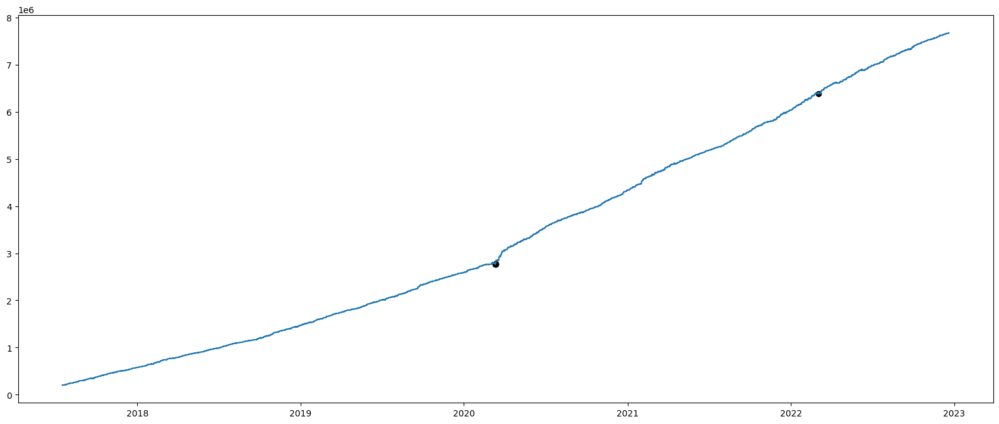

In [41]:

drawdown_figure = plt.figure(figsize=(20,8))
plt.plot(intraday_trade_log['Date'],intraday_trade_log['Equity'])
plt.scatter(drawdown_df['Date'],drawdown_df['Equity'],color='black')

C:\Users\pc\AppData\Local\Temp\ipykernel_8488\1109016795.py:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=('ci', 0)` for the same effect.

  sns.barplot(x='Month-Year', y='%Change', data=returns, estimator=np.median, ci=0)


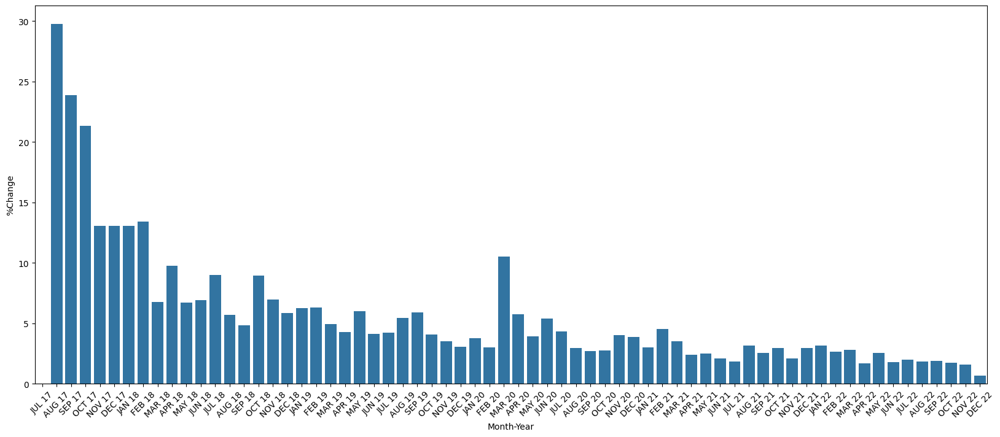

In [42]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

returns['Month-Year'] = returns.apply(lambda x: (str(x['Month']) + ' ' + str(x['Year'])[-2:]).upper(), axis=1)

plt.figure(figsize=(20, 8))
sns.barplot(x='Month-Year', y='%Change', data=returns, estimator=np.median, ci=0)
plt.xticks(rotation=45)  # Rotate x-axis labels by 45 degrees for better visibility
plt.show()



In [43]:
metrics.T


,0
Backtest Start Date,2017-07-17
Backtest End Date,2022-12-20
Number of Trades,10025
Number of Wins,8506
Number of Losses,1516
Average Profit,1119.93
Average Loss,-1352.02
Maximum Profit Points,50012.5
Maximum Loss Points,-29987.5
Median Trade,637.5


In [44]:
broad_returns_image

Month,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec,Total
Year,,,,,,,,,,,,,
2017,nan,nan,nan,nan,nan,nan,nan,29.78,23.87,21.32,13.08,13.05,101.10
2018,13.08,13.41,6.75,9.77,6.70,6.90,9.00,5.71,4.81,8.96,6.95,5.83,97.87
2019,6.25,6.30,4.94,4.25,6.01,4.12,4.20,5.43,5.92,4.09,3.50,3.07,58.09
2020,3.76,2.99,10.53,5.75,3.94,5.41,4.31,2.97,2.72,2.76,4.00,3.88,53.02
2021,3.00,4.52,3.49,2.41,2.52,2.11,1.84,3.14,2.54,2.93,2.10,2.94,33.54
2022,3.15,2.64,2.78,1.68,2.57,1.77,1.97,1.82,1.91,1.73,1.56,0.69,24.26


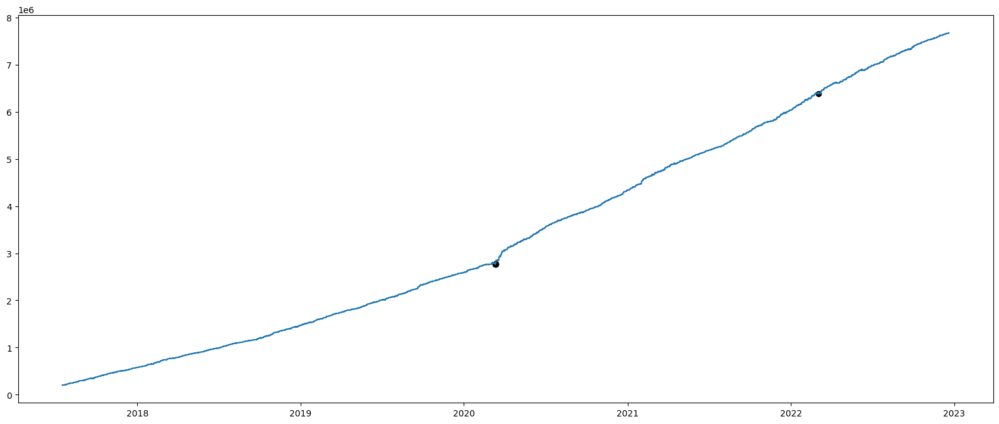

In [45]:
drawdown_figure
